## Motivation
Do the required analysis on the model trained in the previous step

In [1]:
import pandas as pd
import numpy as np
from wordcloud import WordCloud, STOPWORDS 
import urllib
import matplotlib.pyplot as plt 
from PIL import Image
import requests
from io import BytesIO
from random import sample 
import warnings
warnings.filterwarnings(action='once')


%matplotlib inline

In [2]:
result = pd.read_csv("bundle_id_topic.csv")
print(result.shape)
with_icons = pd.read_parquet("/Users/PocketmathUser/Desktop/scraped_data/")
print(with_icons.shape)
result = result.merge(
    with_icons[["bundle_id", "icon_url","primary_genre"]], on="bundle_id", how="left")


(101300, 6)
(44520, 17)


/anaconda3/lib/python3.7/site-packages/pyarrow/pandas_compat.py:293: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  elif isinstance(name, collections.Sequence):
/anaconda3/lib/python3.7/site-packages/pyarrow/pandas_compat.py:708: FutureWarning: .labels was deprecated in version 0.24.0. Use .codes instead.
  labels = getattr(columns, 'labels', None) or [
/anaconda3/lib/python3.7/site-packages/pyarrow/pandas_compat.py:735: FutureWarning: the 'labels' keyword is deprecated, use 'codes' instead
  return pd.MultiIndex(levels=new_levels, labels=labels, names=columns.names)


In [3]:
result[~result.icon_url.isnull()].head()

,bundle_id,topic_num,topic_perc_contrib,keywords,lemmatized_desc,description,icon_url,primary_genre
3,1000991178,15,0.5350,"news, weather, live, sport, late, team, update...",time flagship news brand medium group bring la...,"Hindustan Times, the flagship news brand of th...",https://is1-ssl.mzstatic.com/image/thumb/Purpl...,News
5,1001387844,7,0.3311,"game, fun, mode, challenge, score, match, frie...",blackjack blackjack game store fuss unnecessar...,Do you love Blackjack? Play the best FREE Blac...,https://is1-ssl.mzstatic.com/image/thumb/Purpl...,Games
6,1001425491,9,0.2597,"car, game, drive, truck, race, simulator, park...",drift game store unique car fast furious fun a...,Play the #1 drifting game on the App Store wit...,https://is3-ssl.mzstatic.com/image/thumb/Purpl...,Games
12,1001593357,15,0.1534,"news, weather, live, sport, late, team, update...",magazine finally store panda lead art design p...,The only magazine for pandas is finally on the...,https://is3-ssl.mzstatic.com/image/thumb/Purpl...,Entertainment
16,1001897231,13,0.3203,"word, card, learn, question, test, solitaire, ...",find math operation math wiz enroll math acade...,Find the right math operations and zero in to ...,https://is4-ssl.mzstatic.com/image/thumb/Purpl...,Games


In [4]:
stopwords = set(STOPWORDS)

In [5]:
comment_words = ''
key_words=list(result.keywords)
for val in key_words:
    val=val.replace(",","")
    comment_words=comment_words+val+" "    

In [6]:
wordcloud = WordCloud(width = 1000, height = 800, 
                background_color ='white', collocations=False,
                stopwords = None, 
                min_font_size = 10).generate(comment_words) 

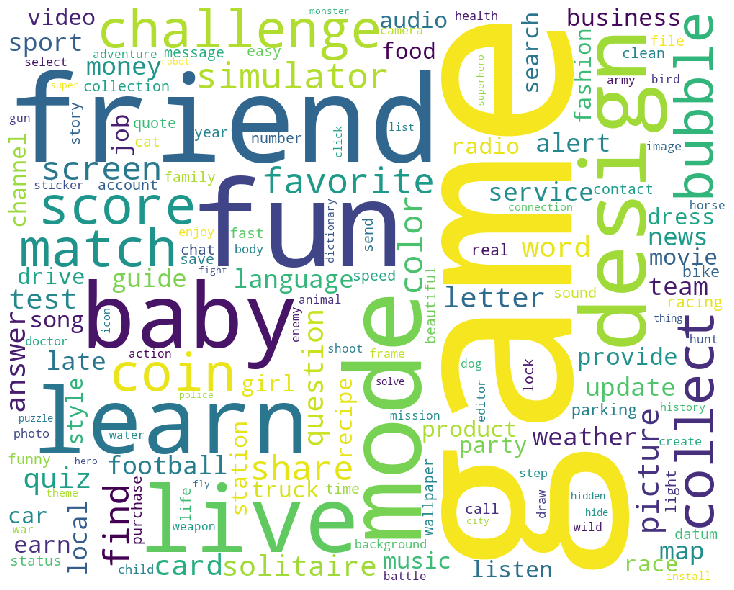

In [7]:
# plot the WordCloud image                        
plt.figure(figsize = (14, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

### Get the icons for each of the generated topics

In [8]:
def plot_images(group):
    cols=3 
    rows=5
    key_word = list(group["keywords"].unique())[0]
    icon_url_list = list(group["icon_url"].unique())
    icon_urls = sample(icon_url_list,(rows*cols))
    
    fig, axes=plt.subplots(rows,cols,figsize=(15,18))
    
    index=0
    for row in range(rows):
        for col in range(cols):
            response = requests.get(icon_urls[index])
            img = Image.open(BytesIO(response.content))
            axes[row][col].imshow(img)
            axes[row][col].set_axis_off()
            index=index+1
    
    file_name=key_word.replace(","," ")
    plt.savefig(f"saved_model/icons/{file_name}.jpg", bbox_inches='tight')
    fig.suptitle(key_word)
    #fig.tight_layout()
       

In [9]:
def get_key_words(group):
    key_word = list(group["keywords"].unique())[0]
    return pd.Series({"keywords": key_word})

topics = result.groupby("topic_num").apply(get_key_words)
topics.reset_index(inplace=True)
pd.set_option('display.max_colwidth', -1)
topics

,topic_num,keywords
0,0,"map, money, guide, service, provide, earn, job, find, business, product"
1,1,"photo, image, picture, frame, share, editor, camera, create, sticker, color"
2,2,"theme, click, list, favorite, install, history, connection, dictionary, icon, search"
3,3,"story, status, friend, life, funny, share, quote, family, collection, year"
4,4,"wallpaper, screen, sound, live, beautiful, lock, cat, background, enjoy, select"
5,5,"animal, simulator, water, dog, wild, horse, adventure, hunt, bird, game"
6,6,"game, city, hero, robot, super, police, monster, superhero, fly, fight"
7,7,"game, fun, mode, challenge, score, match, friend, collect, bubble, coin"
8,8,"video, music, radio, song, listen, station, favorite, audio, movie, channel"
9,9,"car, game, drive, truck, race, simulator, parking, racing, real, bike"


""


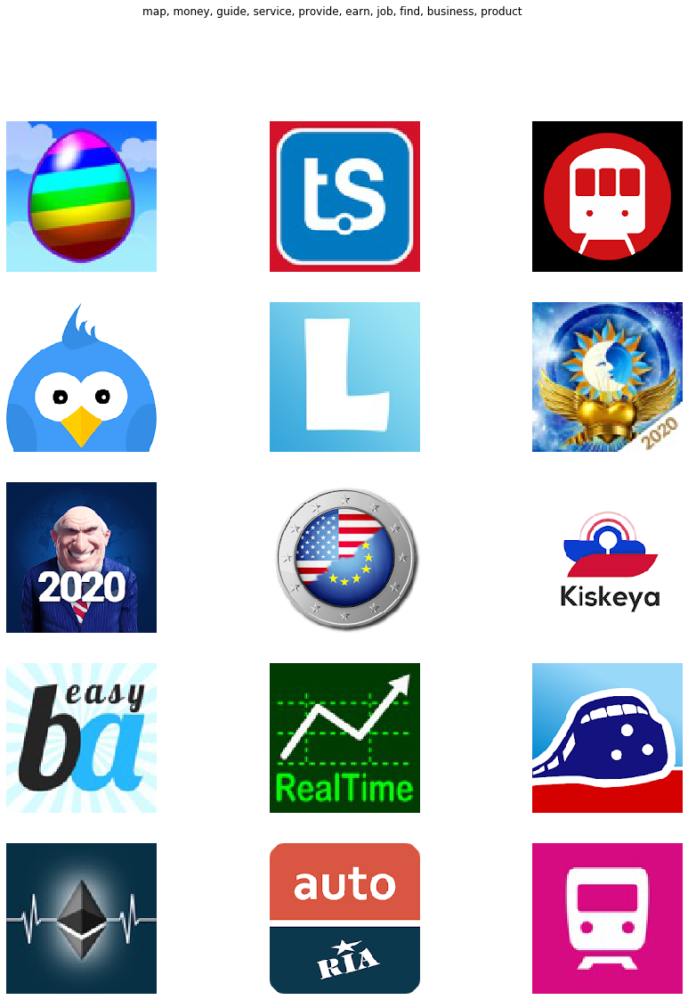

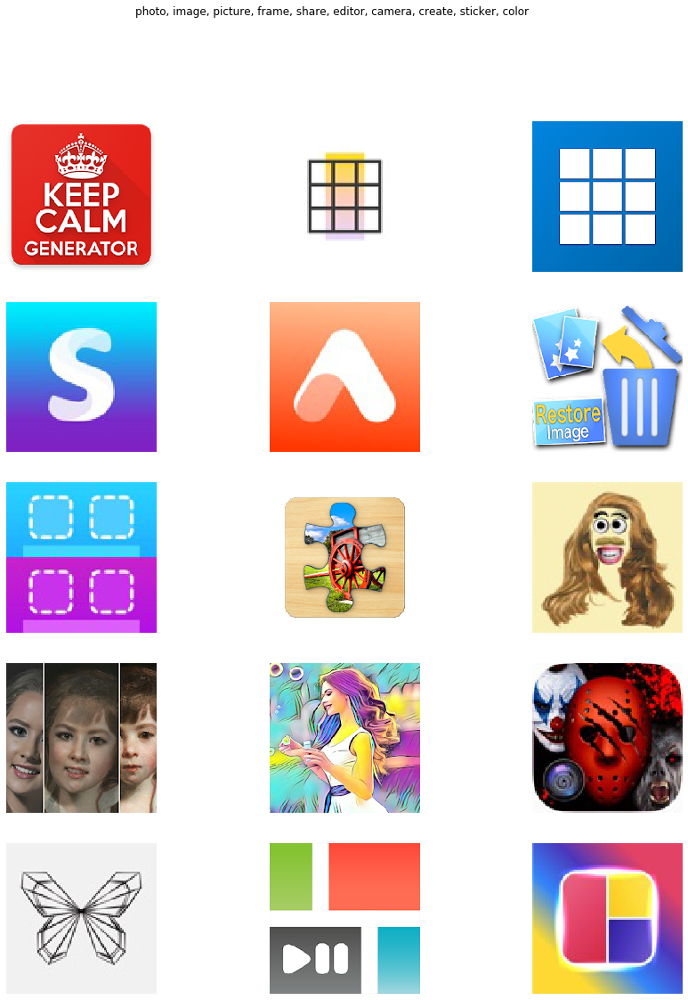

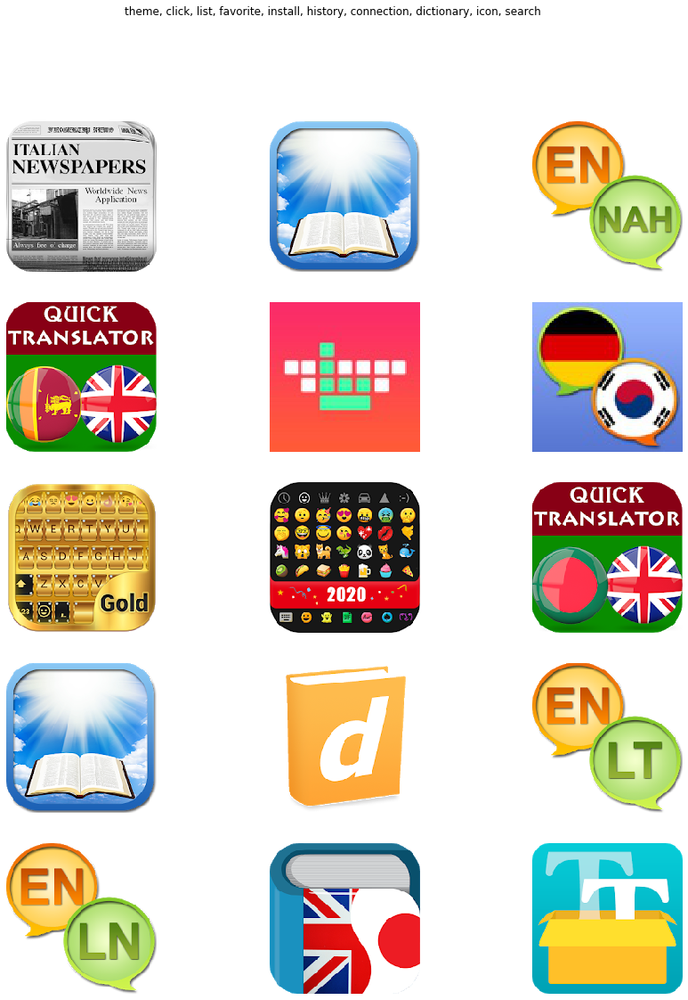

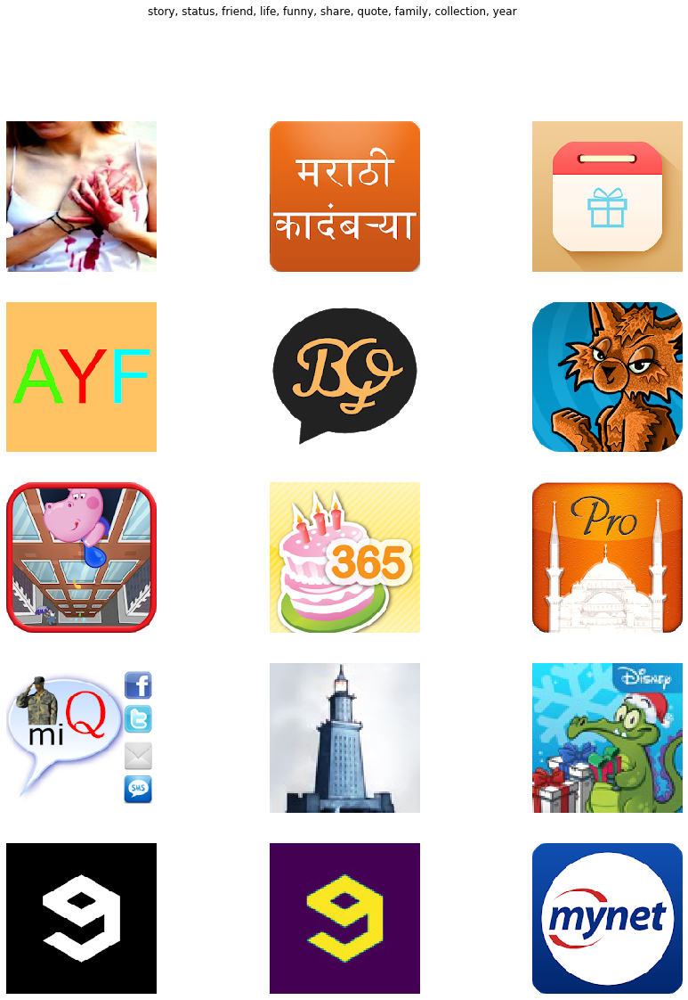

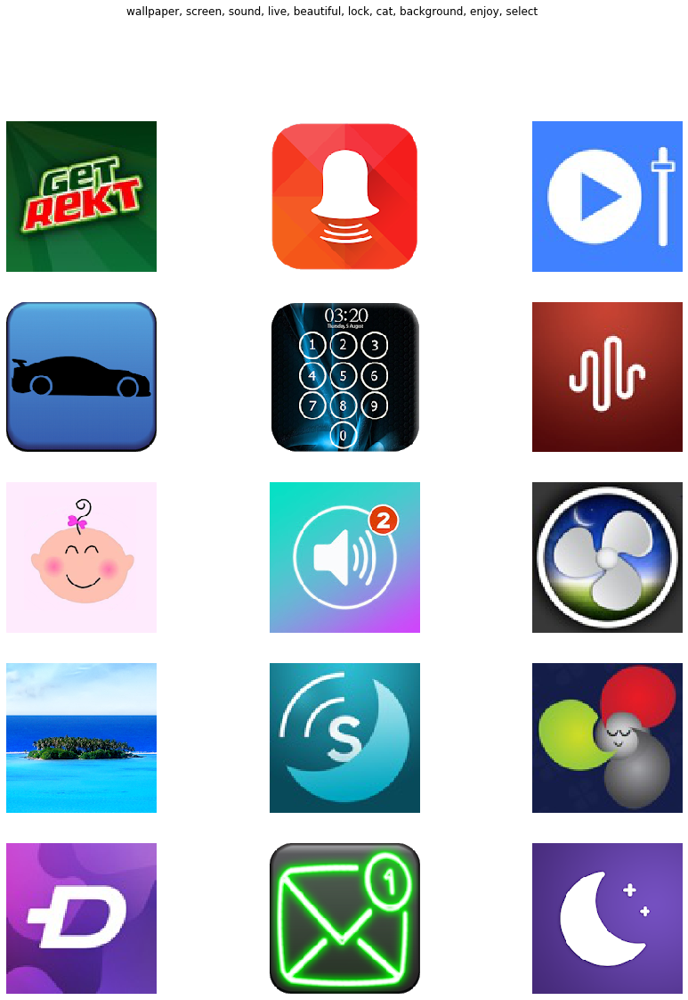

...

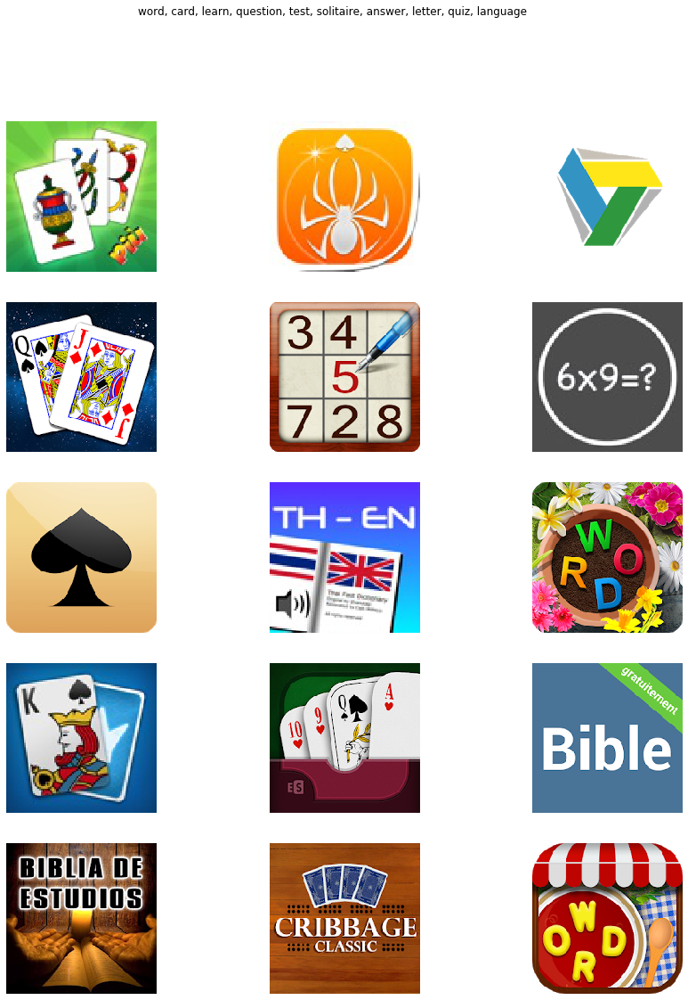

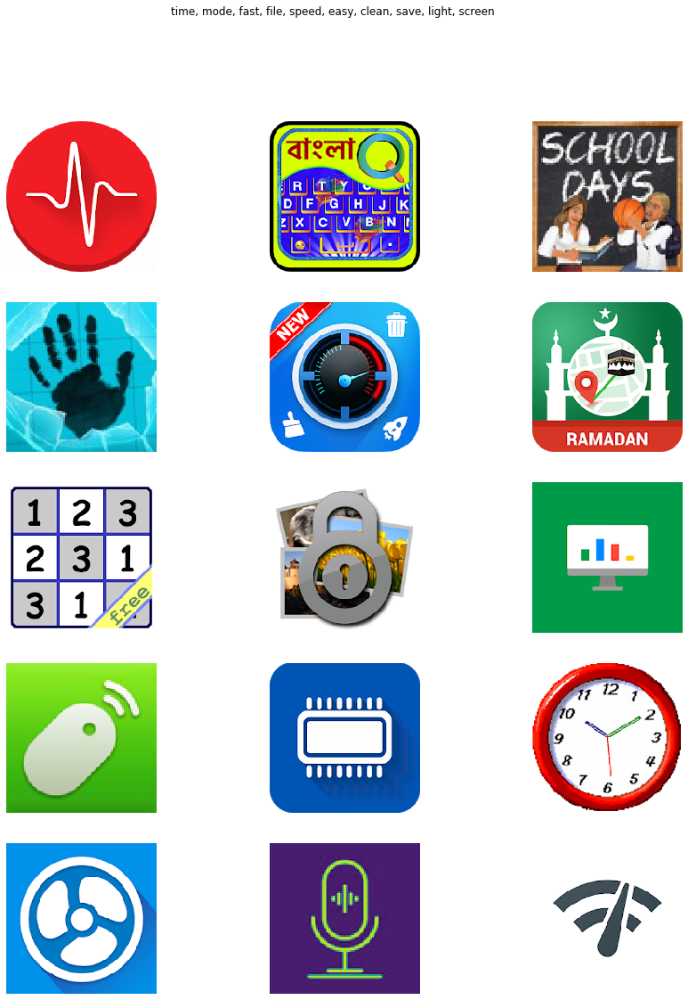

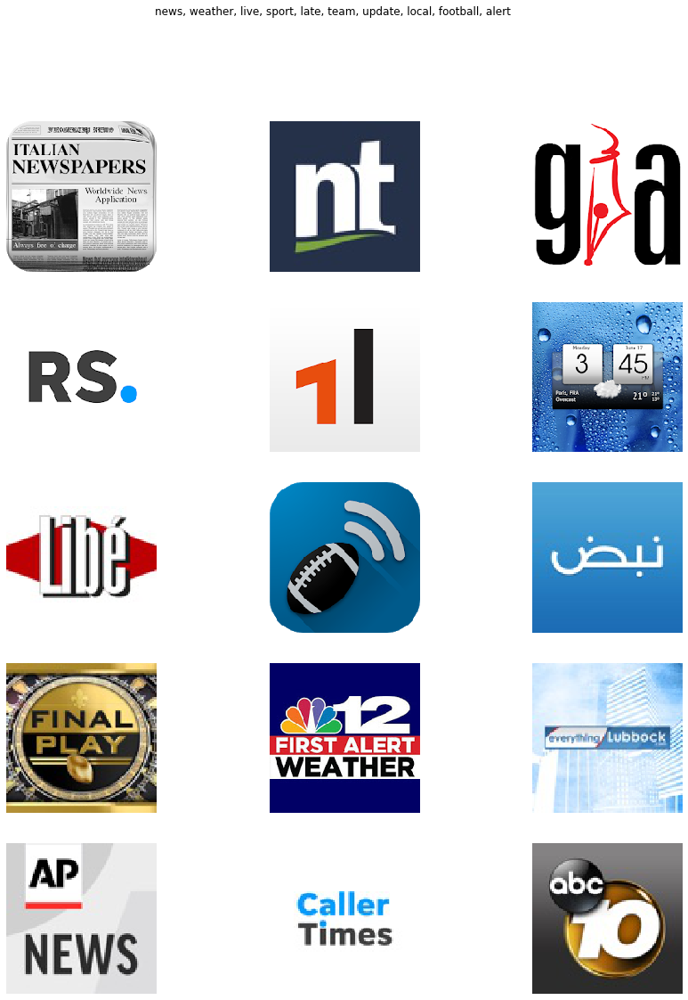

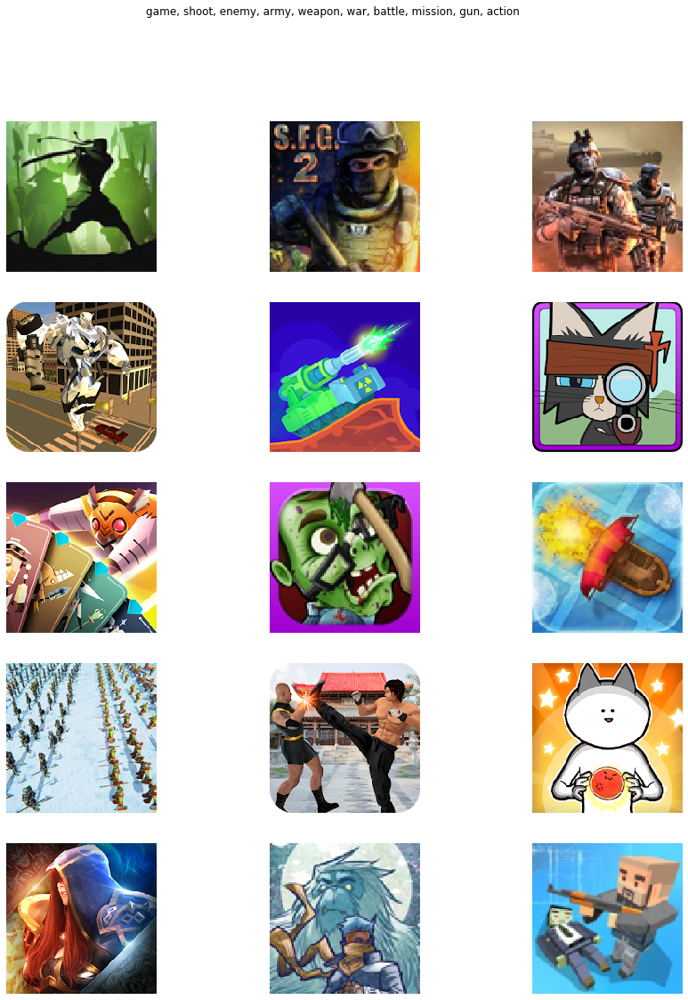

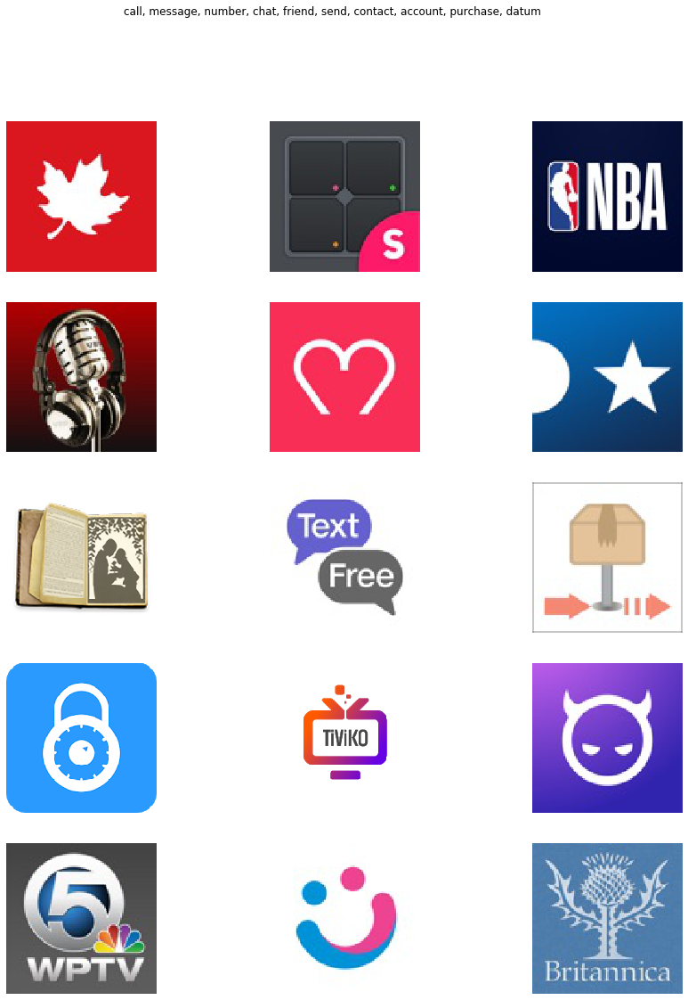

In [10]:
result[(~result.icon_url.isnull())].groupby("topic_num").apply(plot_images)

### Elastic search trials

In [ ]:
from elasticsearch import Elasticsearch, RequestsHttpConnection
from elasticsearch import helpers

In [ ]:
es = Elasticsearch(['https://vpc-app-market-data-vpc-qwelcqdub3ms62edx5fhmvuqyq.us-east-1.es.amazonaws.com:443'],
                   verify_certs=False)
print(es.info())

In [ ]:
index_name='bundle_cluster'
try:
    es.indices.create(index=index_name)
except:
    print(f"index {index_name} already exists")


In [ ]:
actions = []
for index, row in result[(~result.icon_url.isnull())].head(10).iterrows():
    bundle_id = row["bundle_id"]
    icon_url = "" if row["icon_url"] is None else row["icon_url"]
    primary_genre = "" if row["primary_genre"] is None else row["primary_genre"]
    body = {
        "bundle_id": row["bundle_id"],
        "keywords": row["keywords"],
        "cluster_id": row["topic_num"],
        "topic_percentage": row["topic_perc_contrib"],
        "description": row["description"],
        "icon_url": icon_url,
        "genre": primary_genre

    }

    action = {
        "_index": index_name,
        "_type": "cluster_info",
        "_id": bundle_id,
        "_source": body
    }
    actions.append(action)

#     res = es.index(index='bundle_cluster',
#                    doc_type='cluster_info', id=bundle_id, body=body)
#     print(res)
actions

In [ ]:
helpers.bulk(es, actions)

In [ ]:
es.get(index='bundle_cluster',doc_type='cluster_info',id='1000991178')

In [ ]:
es.indices.delete(index='bundle_cluster')